# Getting started with the Vertex AI Gemini 1.5 Pro


<table align="left">
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_1_5_pro.ipynb">

## Overview

Gemini 1.5 Pro is a new language model from the Gemini family. This model introduces a breakthrough long context window of up to 1 million tokens that can help seamlessly analyze large amounts of information and long-context understanding. It can process text, images, audio, video, and code all together for deeper insights.

With this tutorial, you learn how to use the Vertex AI Gemini API and the Vertex AI SDK to work with the Gemini 1.5 Pro model to:

- analyze audio for insights.
- understand videos (including their audio components).
- extract information from PDF documents.
- process images, video, audio, and text simultaneously.

### Install Vertex AI SDK for Python


In [ ]:
! pip3 install --upgrade --user --quiet google-cloud-aiplatform

### Restart runtime

To use the newly installed packages in this Jupyter runtime, you must restart the runtime. You can do this by running the cell below, which restarts the current kernel.

In [ ]:
import sys

if "google.colab" in sys.modules:
    import IPython

    app = IPython.Application.instance()
    app.kernel.do_shutdown(True)

### Authenticate your notebook environment


In [ ]:
import sys

if "google.colab" in sys.modules:
    from google.colab import auth

    auth.authenticate_user()

### Set Google Cloud project information and initialize Vertex AI SDK

To get started using Vertex AI, you must have an existing Google Cloud project and enable the Vertex AI API

In [ ]:
PROJECT_ID = "[your-project-id]"  # @param {type:"string"}
LOCATION = "us-central1"  # @param {type:"string"}

import vertexai

vertexai.init(project=PROJECT_ID, location=LOCATION)

### Import libraries


In [ ]:
from IPython.core.interactiveshell import InteractiveShell
import IPython.display

InteractiveShell.ast_node_interactivity = "all"

from vertexai.generative_models import (
    GenerationConfig,
    GenerativeModel,
    HarmBlockThreshold,
    HarmCategory,
    Part,
)

### Load the Gemini 1.5 Pro model




In [ ]:
MODEL_ID = "gemini-1.5-pro"  # @param {type:"string"}

model = GenerativeModel(MODEL_ID)

### Vertex AI SDK basic usage

Here simple example that demonstrates how to prompt the Gemini 1.5 Pro model using the Vertex AI SDK.

In [ ]:
# Load a example model with system instructions
example_model = GenerativeModel(
    MODEL_ID,
    system_instruction=[
        "You are a helpful language translator.",
        "Your mission is to translate text in English to French.",
    ],
)

# Set model parameters
generation_config = GenerationConfig(
    temperature=0.9,
    top_p=1.0,
    top_k=32,
    candidate_count=1,
    max_output_tokens=8192,
)

# Set safety settings
safety_settings = {
    HarmCategory.HARM_CATEGORY_HARASSMENT: HarmBlockThreshold.BLOCK_LOW_AND_ABOVE,
    HarmCategory.HARM_CATEGORY_HATE_SPEECH: HarmBlockThreshold.BLOCK_LOW_AND_ABOVE,
    HarmCategory.HARM_CATEGORY_SEXUALLY_EXPLICIT: HarmBlockThreshold.BLOCK_LOW_AND_ABOVE,
    HarmCategory.HARM_CATEGORY_DANGEROUS_CONTENT: HarmBlockThreshold.BLOCK_LOW_AND_ABOVE,
}

prompt = """
  User input: I like bagels.
  Answer:
"""

# Set contents to send to the model
contents = [prompt]

# Counts tokens
print(example_model.count_tokens(contents))

# Prompt the model to generate content
response = example_model.generate_content(
    contents,
    generation_config=generation_config,
    safety_settings=safety_settings,
)

# Print the model response
print(f"\nAnswer:\n{response.text}")
print(f'\nUsage metadata:\n{response.to_dict().get("usage_metadata")}')
print(f"\nFinish reason:\n{response.candidates[0].finish_reason}")
print(f"\nSafety settings:\n{response.candidates[0].safety_ratings}")

total_tokens: 14
total_billable_characters: 29


Answer:
J'aime les bagels. 


Usage metadata:
{'prompt_token_count': 14, 'candidates_token_count': 8, 'total_token_count': 22}

Finish reason:
1

Safety settings:
[category: HARM_CATEGORY_HATE_SPEECH
probability: NEGLIGIBLE
probability_score: 0.15077754855155945
severity: HARM_SEVERITY_NEGLIGIBLE
severity_score: 0.07821886986494064
, category: HARM_CATEGORY_DANGEROUS_CONTENT
probability: NEGLIGIBLE
probability_score: 0.06730107963085175
severity: HARM_SEVERITY_NEGLIGIBLE
severity_score: 0.09089674800634384
, category: HARM_CATEGORY_HARASSMENT
probability: NEGLIGIBLE
probability_score: 0.1252792477607727
severity: HARM_SEVERITY_NEGLIGIBLE
severity_score: 0.08525123447179794
, category: HARM_CATEGORY_SEXUALLY_EXPLICIT
probability: NEGLIGIBLE
probability_score: 0.21060390770435333
severity: HARM_SEVERITY_NEGLIGIBLE
severity_score: 0.11260009557008743
]


## Audio understanding

Gemini 1.5 Pro can directly process audio for long-context understanding.


In [ ]:
audio_file_path = "cloud-samples-data/generative-ai/audio/pixel.mp3"
audio_file_uri = f"gs://{audio_file_path}"
audio_file_url = f"https://storage.googleapis.com/{audio_file_path}"

IPython.display.Audio(audio_file_url)

#### Example 1: Summarization

In [ ]:
prompt = """
  Please provide a summary for the audio.
  Provide chapter titles, be concise and short, no need to provide chapter summaries.
  Do not make up any information that is not part of the audio and do not be verbose.
"""

audio_file = Part.from_uri(audio_file_uri, mime_type="audio/mpeg")
contents = [audio_file, prompt]

response = model.generate_content(contents)
print(response.text)

## Pixel Feature Drops: March 2023

This podcast discusses the Pixel feature drops, specifically the March 2023 drop, with product managers Aisha Sharif and DeCarlos Love. 

### Chapters:
 
* **00:00 - 00:13**: Introduction. 
* **00:14 - 00:22**: Podcast introduction. 
* **00:22 - 01:07**: Transformative Pixel features. 
* **01:07 - 02:27**: Importance of feature drops. 
* **02:28 - 03:30**: Highlights from January feature drop.
* **03:31 - 04:52**: March feature drop for Pixel Watch.
* **04:53 - 06:08**: March feature drop for Pixel phones. 
* **06:09 - 07:23**: Deciding what's in a feature drop. 
* **07:24 - 07:57**: User feedback and feature drops. 
* **07:58 - 08:11**: Release date for March feature drop. 
* **08:12 - 08:58**: Favorite feature drops. 
* **08:59 - 10:05**: More favorite feature drops. 
* **10:06 - 10:28**: Outro and thanks. 



#### Example 2: Transcription

In [ ]:
prompt = """
    Can you transcribe this interview, in the format of timecode, speaker, caption.
    Use speaker A, speaker B, etc. to identify the speakers.
"""

audio_file = Part.from_uri(audio_file_uri, mime_type="audio/mpeg")
contents = [audio_file, prompt]

responses = model.generate_content(contents, stream=True)

for response in responses:
    print(response.text)

## Video with audio understanding

Try out Gemini 1.5 Pro's native multimodal and long context capabilities on video interleaving with audio inputs.

In [ ]:
video_file_path = "cloud-samples-data/generative-ai/video/pixel8.mp4"
video_file_uri = f"gs://{video_file_path}"
video_file_url = f"https://storage.googleapis.com/{video_file_path}"

IPython.display.Video(video_file_url, width=450)

In [ ]:
prompt = """
  Provide a description of the video.
  The description should also contain anything important which people say in the video.
"""

video_file = Part.from_uri(video_file_uri, mime_type="video/mp4")
contents = [video_file, prompt]

response = model.generate_content(contents)
print(response.text)

The video is about a photographer in Tokyo named Saek Shimada. She talks about how Tokyo has many different faces and how the city at night is totally different from what you see during the day. She then introduces the new Pixel phone and its "Video Boost" feature, which automatically activates Night Sight in low-light conditions to improve video quality. Saek Shimada then takes the viewer on a tour of some of her favorite spots in Tokyo at night, including Sancha, where she used to live when she first moved to Tokyo, and Shibuya. 


Gemini 1.5 Pro model is able to process the video with audio, retrieve and extract textual and audio information.

## PDF document analysis

You can use Gemini 1.5 Pro to process PDF documents, and analyze content, retain information, and provide answers to queries regarding the documents.

The PDF document example used here is the Gemini 1.5 paper (https://arxiv.org/pdf/2403.05530.pdf).

![image.png](https://storage.googleapis.com/cloud-samples-data/generative-ai/image/gemini1.5-paper-2403.05530.png)

In [ ]:
pdf_file_uri = "gs://cloud-samples-data/generative-ai/pdf/2403.05530.pdf"

prompt = """
  Your are a very professional document summarization specialist.
  Please summarize the given document.
"""

pdf_file = Part.from_uri(pdf_file_uri, mime_type="application/pdf")
contents = [pdf_file, prompt]

response = model.generate_content(contents)
print(response.text)

## Summary of "Gemini 1.5: Unlocking multimodal understanding across millions of tokens of context"

**Gemini 1.5 Pro** is a new large language model (LLM) from Google DeepMind capable of processing and understanding extremely long sequences of information across various modalities like text, code, images, audio, and video. It utilizes a mixture-of-experts architecture and achieves state-of-the-art performance on many tasks while being significantly more efficient than previous models. 

**Key advancements and findings:**

* **Unprecedented context length:** Gemini 1.5 Pro can handle up to 10 million tokens of context, enabling it to process information like entire books, days-long audio recordings, and hours of video. This opens up new possibilities for applications like analyzing large datasets, summarizing documents, and understanding complex video content.
* **Improved performance across modalities:** The model surpasses its predecessors and even matches or exceeds the performance 

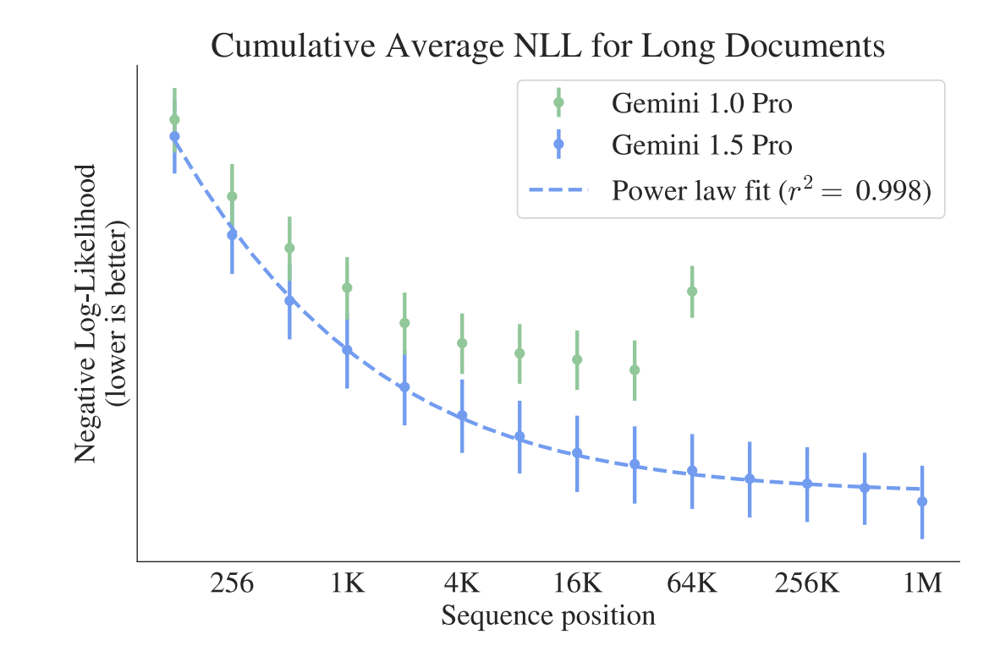

In [ ]:
image_file_path = "cloud-samples-data/generative-ai/image/cumulative-average.png"
image_file_url = f"https://storage.googleapis.com/{image_file_path}"
image_file_uri = f"gs://{image_file_path}"

IPython.display.Image(image_file_url, width=450)

In [ ]:
prompt = """
Task: Answer the following questions based on a PDF document and image file provided in the context.

Instructions:
- Look through the image and the PDF document carefully and answer the question.
- Give a short and terse answer to the following question.
- Do not paraphrase or reformat the text you see in the image.
- Cite the source of page number for the PDF document provided as context.

  Questions:
  - What is in the given image?
  - Is there a similar graph in the given document?

Context:
"""

contents = [
    pdf_file,
    image_file_uri,
    prompt,
]

response = model.generate_content(contents)
print(response.text)

## Analysis of Request:

The task requires the model to:

1. **Process Multimodal Information:** Analyze both an image and a PDF document provided as context.
2. **Understand Long Context:** The PDF document could potentially be lengthy, requiring the model to handle long sequences of text.
3. **Perform Information Retrieval:** Locate specific information within the image and document relevant to the questions.
4. **Reason and Answer Questions:** Provide concise answers based on the extracted information.
5. **Cite Sources:** Include page numbers from the PDF document to support the answers.

## Potential Challenges: 

* **Image Understanding:** Accurately interpreting the content of the image, especially if it's complex or contains charts/graphs.
* **Long Document Comprehension:** Efficiently processing and retaining information from a potentially long PDF document.
* **Information Retrieval:** Identifying the specific sections within the document that contain relevant information for

Gemini 1.5 Pro is able to identify and locate the graph on page 8 from the PDF document.


## All modalities (images, video, audio, text) at once

Gemini 1.5 Pro is natively multimodal and supports interleaving of data from different modalities, it can support a mix of audio, visual, text, and
code inputs in the same input sequence.

In [ ]:
video_file_path = "cloud-samples-data/generative-ai/video/behind_the_scenes_pixel.mp4"
video_file_uri = f"gs://{video_file_path}"
video_file_url = f"https://storage.googleapis.com/{video_file_path}"

IPython.display.Video(video_file_url, width=450)

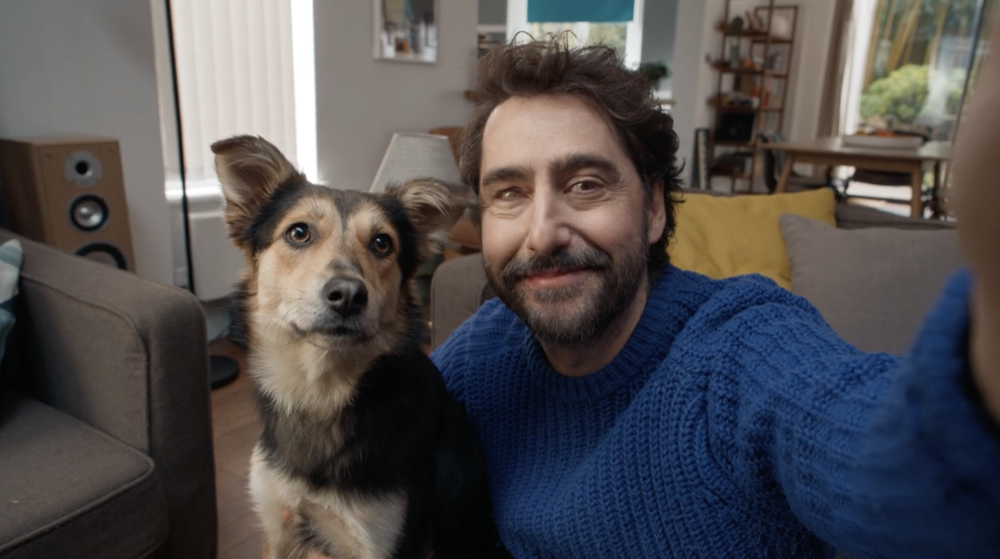

In [ ]:
image_file_path = "cloud-samples-data/generative-ai/image/a-man-and-a-dog.png"
image_file_uri = f"gs://{image_file_path}"
image_file_url = f"https://storage.googleapis.com/{image_file_path}"

IPython.display.Image(image_file_url, width=450)

In [ ]:
video_file = Part.from_uri(video_file_uri, mime_type="video/mp4")
image_file = Part.from_uri(image_file_uri, mime_type="image/png")

prompt = """
  Look through each frame in the video carefully and answer the questions.
  Only base your answers strictly on what information is available in the video attached.
  Do not make up any information that is not part of the video and do not be too
  verbose, be to the point.

  Questions:
  - When is the moment in the image happening in the video? Provide a timestamp.
  - What is the context of the moment and what does the narrator say about it?
"""

contents = [video_file, image_file, prompt]

response = model.generate_content(contents)
print(response.text)

- The timestamp of the image is 00:49.
- The context of the moment is that the narrator, Adam, is taking a selfie with his dog. He says that the story is about a blind man and his girlfriend, and that we follow them on their journey together.


## Conclusion

In this tutorial, you've learned how to use the Gemini 1.5 Pro with the Vertex AI SDK to:

- analyze audio for insights.
- understand videos (including their audio components).
- extract information from PDF documents.
- process images, video, audio, and text simultaneously.